,File Name,Color Model,Format,Channels,Size (MB),Width,Height,Full Path,Thumbnail
0,bmw_avtomobil_bamper_191131_300x255.jpg,RGB,JPEG,3,0.01,300,255,files\bmw_avtomobil_bamper_191131_300x255.jpg,
1,bmw_e34_krasnyj_96487_300x255.jpg,RGB,JPEG,3,0.01,300,255,files\bmw_e34_krasnyj_96487_300x255.jpg,
2,bmw_mashina_sportivnyj_139454_300x255.jpg,RGB,JPEG,3,0.02,300,255,files\bmw_mashina_sportivnyj_139454_300x255.jpg,
3,bmw_mashina_vid_speredi_164813_300x255.jpg,RGB,JPEG,3,0.01,300,255,files\bmw_mashina_vid_speredi_164813_300x255.jpg,
4,bugatti_chiron_bugatti_sportkar_129532_300x255.jpg,RGB,JPEG,3,0.02,300,255,files\bugatti_chiron_bugatti_sportkar_129532_300x255.jpg,
5,koenigsegg_agera_rs_107373_300x255.jpg,RGB,JPEG,3,0.03,300,255,files\koenigsegg_agera_rs_107373_300x255.jpg,
6,lamborghini_aventador_lp7504_108049_300x255.jpg,RGB,JPEG,3,0.01,300,255,files\lamborghini_aventador_lp7504_108049_300x255.jpg,
7,lamborghini_huracan_performante_lamborghini_huracan_lamborghini_129438_300x255.jpg,RGB,JPEG,3,0.02,300,255,files\lamborghini_huracan_performante_lamborghini_huracan_lamborghini_129438_300x255.jpg,
8,lamborghini_mashina_sportkar_146392_300x255.jpg,RGB,JPEG,3,0.02,300,255,files\lamborghini_mashina_sportkar_146392_300x255.jpg,
9,mansory_cyrus_aston_martin_db9_99003_300x255.jpg,RGB,JPEG,3,0.01,300,255,files\mansory_cyrus_aston_martin_db9_99003_300x255.jpg,

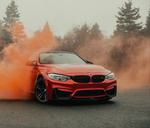
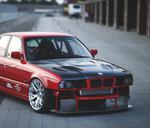
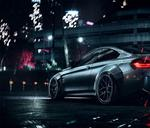
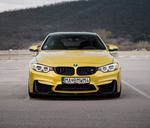
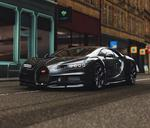
...
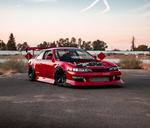
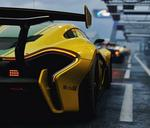
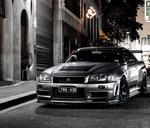
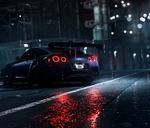
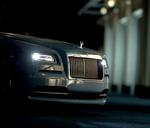

In [1]:
import os
import pandas as pd
from PIL import Image
from io import BytesIO
import base64

def create_thumbnail(image_path):
    with Image.open(image_path) as img:
        img.thumbnail((150, 150), Image.LANCZOS)
        if img.mode in ['P', 'RGBA']:  
            img = img.convert('RGB')
        return img

def convert_image_to_base64(image):
    with BytesIO() as buffer:
        image.save(buffer, format='JPEG')
        return base64.b64encode(buffer.getvalue()).decode()

def format_image_html(image_path):
    thumbnail = create_thumbnail(image_path)
    image_data = convert_image_to_base64(thumbnail)
    return f'<img src="data:image/jpeg;base64,{image_data}">'

def analyze_image_folder(folder_path):
    image_files = [os.path.join(folder_path, f) for f in os.listdir(folder_path)]
    image_data = []

    for image_file in image_files:
        try:
            with Image.open(image_file) as img:
                image_info = {
                    'File Name': os.path.basename(image_file),
                    'Color Model': img.mode,
                    'Format': img.format,
                    'Channels': len(img.getbands()),
                    'Size (MB)': round(os.path.getsize(image_file) / (1024 * 1024), 2),
                    'Width': img.width,
                    'Height': img.height,
                    'Full Path': image_file,
                    'Thumbnail': image_file 
                }
                image_data.append(image_info)
        except Exception:
            continue

    return pd.DataFrame(image_data)

folder_path = 'files'
image_dataframe = analyze_image_folder(folder_path)

from IPython.display import HTML
HTML(image_dataframe.to_html(escape=False, formatters={'Thumbnail': format_image_html}))

Постер збережено у файл: poster_1.png


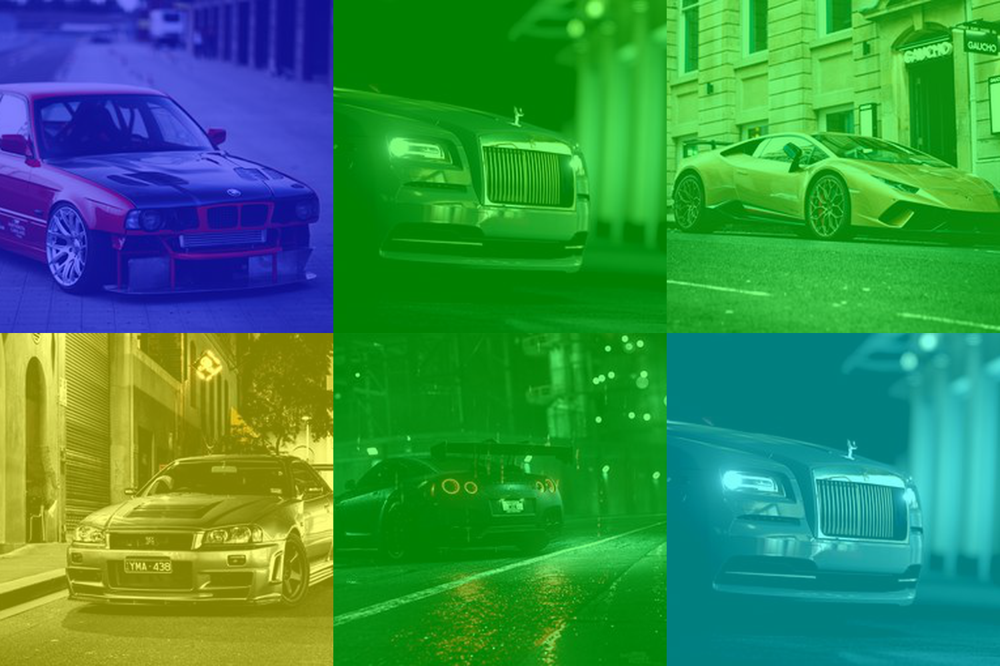

Постер збережено у файл: poster_2.png


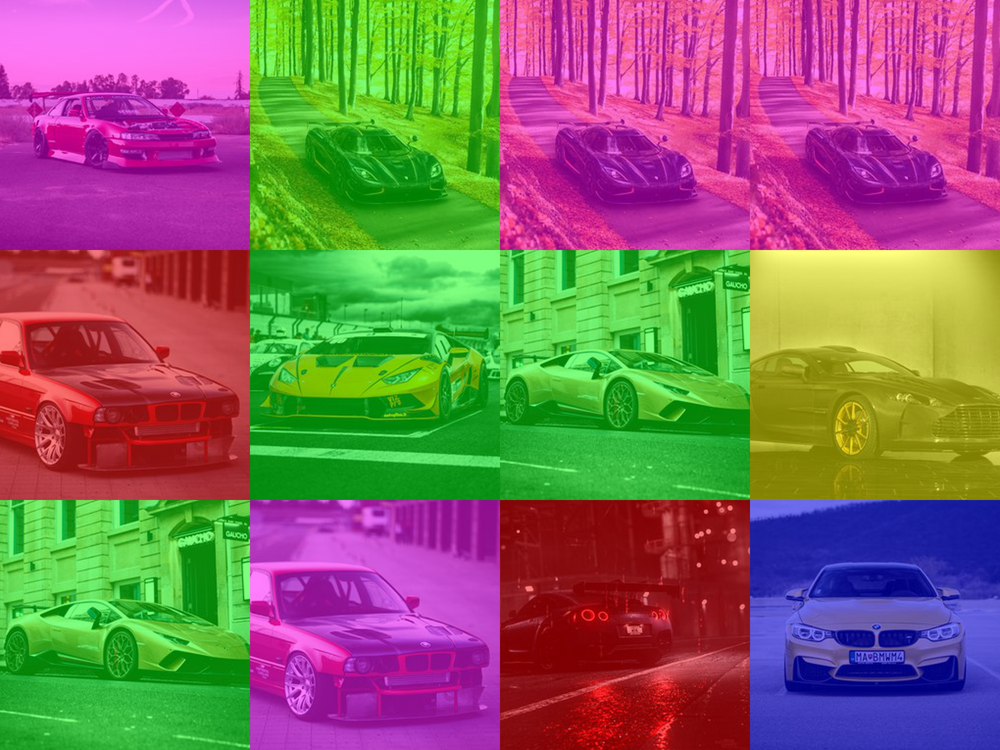

Постер збережено у файл: poster_3.png


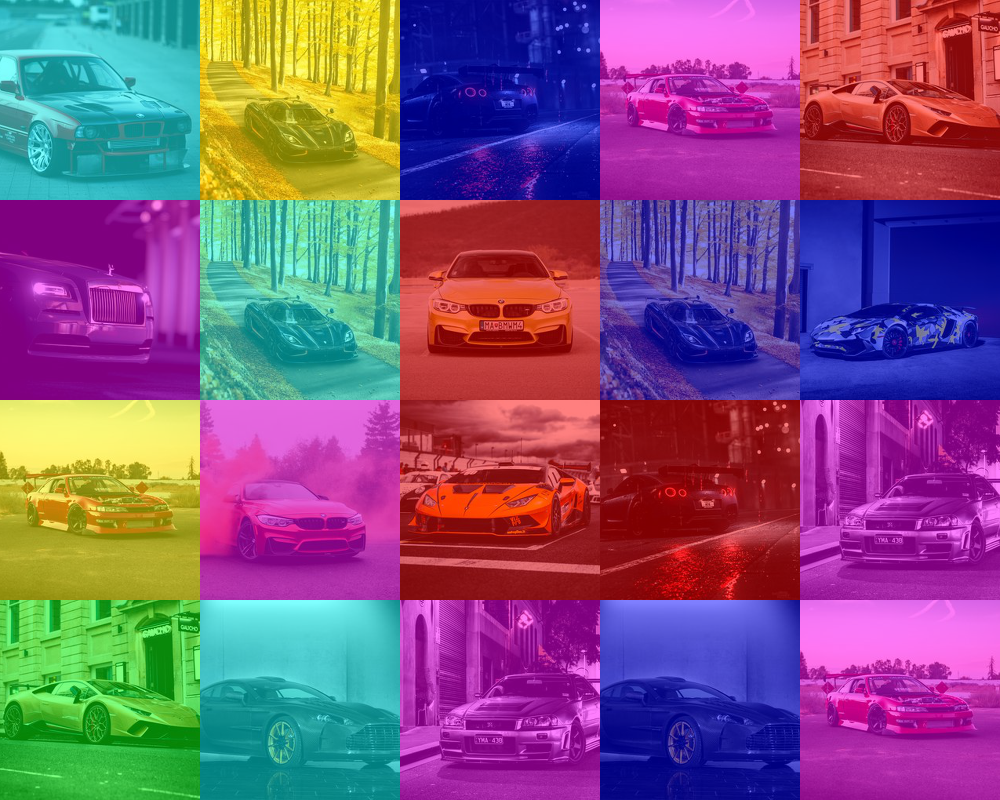

Усі постери створено та відображено.


In [2]:
import os
import random
from PIL import Image, ImageOps
from IPython.display import display

def crop_to_square(image):
    width, height = image.size
    min_side = min(width, height)
    left = (width - min_side) // 2
    top = (height - min_side) // 2
    right = left + min_side
    bottom = top + min_side
    return image.crop((left, top, right, bottom))


def resize_image(image, size=(500, 500)):
    return image.resize(size, Image.LANCZOS)


def apply_color_filter(image, color):
    filter_layer = Image.new('RGB', image.size, color)
    return Image.blend(image, filter_layer, alpha=0.5)


def create_poster(path, output_name, rows, cols):
    supported_extensions = ('png', 'jpg', 'jpeg', 'gif')
    image_files = [os.path.join(path, f) for f in os.listdir(path) if f.endswith(supported_extensions)]

    if not image_files:
        raise ValueError("У папці немає доступних зображень.")

    img_size = (500, 500)
    poster_width = cols * img_size[0]
    poster_height = rows * img_size[1]

    poster = Image.new('RGB', (poster_width, poster_height))

    # Кольорові фільтри
    color_filters = [
        (255, 0, 0),    # Червоний
        (0, 255, 0),    # Зелений
        (0, 0, 255),    # Синій
        (255, 255, 0),  # Жовтий
        (0, 255, 255),  # Голубий
        (255, 0, 255)   # Пурпурний
    ]

    for row in range(rows):
        for col in range(cols):
            img_path = random.choice(image_files)
            with Image.open(img_path) as img:
                img = crop_to_square(img)
                img = resize_image(img, img_size)
                img = apply_color_filter(img, random.choice(color_filters))
                x = col * img_size[0]
                y = row * img_size[1]
                poster.paste(img, (x, y))

    poster.save(output_name)
    return poster

image_folder = 'files'

# Створюємо декілька варіантів постерів
poster_variants = [
    ('poster_1.png', 2, 3),
    ('poster_2.png', 3, 4),
    ('poster_3.png', 4, 5),
]

# Генеруємо та виводимо постери
for output_file, rows, cols in poster_variants:
    poster = create_poster(image_folder, output_file, rows, cols)
    print(f"Постер збережено у файл: {output_file}")
    display(poster)

print("Усі постери створено та відображено.")